In [79]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

In [80]:
location = "properatti.csv"
data = pd.read_csv(location, sep=",", index_col=0)

Visualización del dataframe

In [81]:
print(data.shape)

(121220, 25)


In [82]:
#pd.options.display.max_columns = None
#data.sample(10)
data.head(4)

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,...,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
0,sell,PH,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6618237,-58.5088387",-34.661824,-58.508839,...,40.0,1127.272727,1550.000000,NaN,NaN,NaN,http://www.properati.com.ar/15bo8_venta_ph_mat...,"2 AMBIENTES TIPO CASA PLANTA BAJA POR PASILLO,...",2 AMB TIPO CASA SIN EXPENSAS EN PB,https://thumbs4.properati.com/8/BluUYiHJLhgIIK...
1,sell,apartment,La Plata,|Argentina|Bs.As. G.B.A. Zona Sur|La Plata|,Argentina,Bs.As. G.B.A. Zona Sur,3432039.0,"-34.9038831,-57.9643295",-34.903883,-57.964330,...,NaN,NaN,NaN,NaN,NaN,NaN,http://www.properati.com.ar/15bob_venta_depart...,Venta de departamento en décimo piso al frente...,VENTA Depto 2 dorm. a estrenar 7 e/ 36 y 37 ...,https://thumbs4.properati.com/7/ikpVBu2ztHA7jv...
2,sell,apartment,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6522615,-58.5229825",-34.652262,-58.522982,...,55.0,1309.090909,1309.090909,NaN,NaN,NaN,http://www.properati.com.ar/15bod_venta_depart...,2 AMBIENTES 3ER PISO LATERAL LIVING COMEDOR AM...,2 AMB 3ER PISO CON ASCENSOR APTO CREDITO,https://thumbs4.properati.com/5/SXKr34F_IwG3W_...
3,sell,PH,Liniers,|Argentina|Capital Federal|Liniers|,Argentina,Capital Federal,3431333.0,"-34.6477969,-58.5164244",-34.647797,-58.516424,...,NaN,NaN,NaN,NaN,NaN,NaN,http://www.properati.com.ar/15boh_venta_ph_lin...,PH 3 ambientes con patio. Hay 3 deptos en lote...,PH 3 amb. cfte. reciclado,https://thumbs4.properati.com/3/DgIfX-85Mog5SP...


Explorado los datos

In [83]:
data.info()
# 8   lat-lon  object 
#data.convert_dtypes().dtypes #podria servir


<class 'pandas.core.frame.DataFrame'>
Int64Index: 121220 entries, 0 to 121219
Data columns (total 25 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   operation                   121220 non-null  object 
 1   property_type               121220 non-null  object 
 2   place_name                  121197 non-null  object 
 3   place_with_parent_names     121220 non-null  object 
 4   country_name                121220 non-null  object 
 5   state_name                  121220 non-null  object 
 6   geonames_id                 102503 non-null  float64
 7   lat-lon                     69670 non-null   object 
 8   lat                         69670 non-null   float64
 9   lon                         69670 non-null   float64
 10  price                       100810 non-null  float64
 11  currency                    100809 non-null  object 
 12  price_aprox_local_currency  100810 non-null  float64
 13  price_aprox_us

In [84]:
print(data.isna().sum())
#price, currency, price_aprox, price_usd tienen la misma cantidad de nulos 20410
#hay que averiguar si price_per_m2 es la relacion de price y surface_total, así podriamos completar nulos en price_per_m2: SI ES

operation                          0
property_type                      0
place_name                        23
place_with_parent_names            0
country_name                       0
state_name                         0
geonames_id                    18717
lat-lon                        51550
lat                            51550
lon                            51550
price                          20410
currency                       20411
price_aprox_local_currency     20410
price_aprox_usd                20410
surface_total_in_m2            39328
surface_covered_in_m2          19907
price_usd_per_m2               52603
price_per_m2                   33562
floor                         113321
rooms                          73830
expenses                      106958
properati_url                      0
description                        2
title                              0
image_thumbnail                 3112
dtype: int64


In [85]:
data.isna().sum()/data.shape[0] *100

#podriamos completar place_name
#cambiar los nombres de las columnas?
#geonames_id está en float?
#lat-long ver si podemos completar donde falte lat y long se podrian borrar las individuales  

operation                      0.000000
property_type                  0.000000
place_name                     0.018974
place_with_parent_names        0.000000
country_name                   0.000000
state_name                     0.000000
geonames_id                   15.440521
lat-lon                       42.525986
lat                           42.525986
lon                           42.525986
price                         16.837156
currency                      16.837981
price_aprox_local_currency    16.837156
price_aprox_usd               16.837156
surface_total_in_m2           32.443491
surface_covered_in_m2         16.422208
price_usd_per_m2              43.394654
price_per_m2                  27.686850
floor                         93.483749
rooms                         60.905791
expenses                      88.234615
properati_url                  0.000000
description                    0.001650
title                          0.000000
image_thumbnail                2.567233


In [86]:

data.describe(include="all")

#count: cuenta el numero de registros no incluye null
#unique:  número de objetos distintos en la columna,
#top: es el dato más frecuente que se produce,
#freq: es la cantidad de veces que aparece el objeto “top” en la columna.

# # de la columna "place_with_parent_name" 
# lat-long hay datos repetidos o son los mismos edificios o representan un area determinada
# operation y country_name 1 solo dato 
# cambiar el dato de geonames_id
# currency tiene 4 tipos de monedas
# hay un tipo de propiedad con 32 habitaciones?
# hay un tipo de propiedad con 3150 pisos?

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,...,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
count,121220,121220,121197,121220,121220,121220,1.025030e+05,69670,69670.000000,69670.000000,...,101313.000000,68617.000000,8.765800e+04,7899.000000,47390.000000,1.426200e+04,121220,121218,121220,118108
unique,1,4,1060,1164,1,28,NaN,47203,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,121220,104055,72705,114389
top,sell,apartment,Córdoba,|Argentina|Santa Fe|Rosario|,Argentina,Capital Federal,NaN,"-34.4026444,-58.6684776",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,http://www.properati.com.ar/15bo8_venta_ph_mat...,AVISO LEGAL: Las descripciones arquitectónicas...,DEPARTAMENTO EN VENTA,https://thumbs4.properati.com/5/yyMiu8BHQI9KXC...
freq,121220,71065,9254,8504,121220,32316,NaN,312,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,358,4855,255
mean,NaN,NaN,NaN,NaN,NaN,NaN,3.574442e+06,NaN,-34.626210,-59.266290,...,133.050181,2160.086916,6.912216e+03,17.452336,3.080840,5.009234e+03,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,3.541306e+05,NaN,1.980936,2.299922,...,724.351479,2759.288621,2.837864e+04,120.243621,1.860773,1.204403e+05,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,3.427208e+06,NaN,-54.823985,-75.678931,...,0.000000,0.600000,1.510204e+00,1.000000,1.000000,1.000000e+00,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,3.430234e+06,NaN,-34.669065,-58.727040,...,45.000000,1218.181818,1.550000e+03,1.000000,2.000000,1.000000e+03,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,3.433910e+06,NaN,-34.597985,-58.480128,...,75.000000,1800.000000,2.213115e+03,3.000000,3.000000,2.000000e+03,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,3.836668e+06,NaN,-34.441299,-58.395908,...,150.000000,2486.411765,3.355549e+03,6.000000,4.000000,4.000000e+03,NaN,NaN,NaN,NaN


In [87]:
#valores unicos x columna
for columnas in data.columns:
    print("")
    print(f'Nombre:{columnas}')
    print(data[columnas].value_counts())


Nombre:operation
sell    121220
Name: operation, dtype: int64

Nombre:property_type
apartment    71065
house        40268
PH            5751
store         4136
Name: property_type, dtype: int64

Nombre:place_name
Córdoba               9254
Rosario               8504
Mar del Plata         6534
Tigre                 3324
Nordelta              3315
                      ... 
Sierras Bayas            1
Paso de los Libres       1
Azara                    1
Coronel Du Graty         1
Altos de Hudson I        1
Name: place_name, Length: 1060, dtype: int64

Nombre:place_with_parent_names
|Argentina|Santa Fe|Rosario|                                        8504
|Argentina|Córdoba|Córdoba|                                         6606
|Argentina|Buenos Aires Costa Atlántica|Mar del Plata|              6534
|Argentina|Bs.As. G.B.A. Zona Norte|Tigre|Nordelta|                 3315
|Argentina|Capital Federal|Belgrano|                                2992
                                               

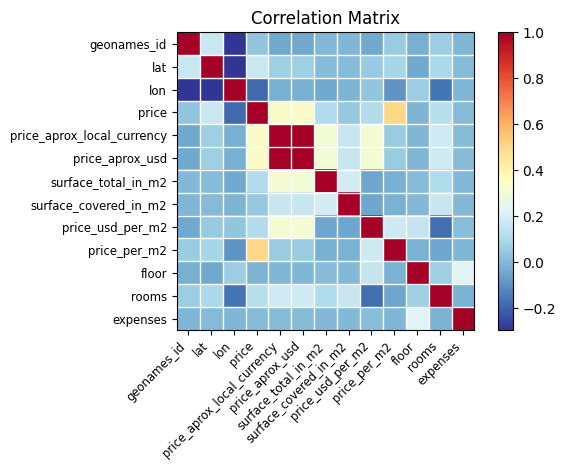

In [88]:
corr = data.set_index('place_name').corr()
sm.graphics.plot_corr(corr, xnames=list(corr.columns))
plt.show()

#Hay una correlacion entre price y price_aprox_local_currency : price está en dolares y local currency en pesos
#al multiplicar price por la tasa de cambio tenemos price_aprox_local currency

In [89]:
#vemos el tipo de cambio utilizado
tasa_cambio = data['price_aprox_local_currency'] / data['price_aprox_usd']
#data["tipo_de_cambio"] = data['price_aprox_local_currency'] / data['price_aprox_usd']
#data["tipo_de_cambio"]
tasa_cambio.unique()

#aqui vemos que aparecen datos diferentes por los decimales,entonces vamos a redondear a 2 decimales 
#price_aprox_local_currency     20410
#price_aprox_usd                20410

array([17.6445    ,         nan, 17.64449974, ..., 17.64449995,
       17.64449998, 17.64449994])

In [90]:
print(tasa_cambio.round(2).unique()) #a ver si hay otro valor
print(tasa_cambio.isna().sum()) # 

[17.64   nan]
20411


In [91]:
data['price_aprox_usd'].sample(10)

19260      130000.00
36781      315000.00
80732      128479.00
105404           NaN
45109            NaN
29531      258000.00
80          92000.00
46586     1857930.00
108039     130000.00
98650       60570.37
Name: price_aprox_usd, dtype: float64

In [92]:
data['price_aprox_usd'].notnull().sum()

100810

In [93]:
data['price_aprox_usd'].notnull

<bound method Series.notnull of 0          62000.0
1         150000.0
2          72000.0
3          95000.0
4          64000.0
            ...   
121215    870000.0
121216    498000.0
121217    131500.0
121218     95900.0
121219    129000.0
Name: price_aprox_usd, Length: 121220, dtype: float64>

In [94]:
#price                          20410
#price_aprox_usd                20410  #price tiene la misma cantidad de registris que price_aprox_usd 
#currency

#surface_total_in_m2            39328
# price_usd_per_m2              52603
# price_per_m2                  33562

buscando_precio_usd_m2 = data['price_aprox_usd'] / data['surface_total_in_m2']
print(buscando_precio_usd_m2)
print(buscando_precio_usd_m2.isna().sum())

#aqui vemos si el dato de price_usd_per_m2 es la relacion de price_aprox entre la superficie_total_in_m2
#price está en USD y otras monedas entonces el calculo va a estar en dolar u otras monedas 
#como la relacion de estas dos columnas me da los datos de precio_usd_per_m2, si tengo nan en alguna de estas columnas lo puedo reemplazar
#hacer una comparacion entre esta columna y la de data

0         1127.272727
1                 NaN
2         1309.090909
3                 NaN
4         1828.571429
             ...     
121215    7699.115044
121216    1383.333333
121217    2858.695652
121218    1997.916667
121219    1675.324675
Length: 121220, dtype: float64
52354


In [95]:
#agrego la columna nueva a data
data["precio_usd_m2_calculado"]= data['price_aprox_usd'] / data['surface_total_in_m2']

In [96]:
#comparo las columna original con la columna de precio_m2 original
precio_usd_m2_match = (data['price_usd_per_m2'] == data['precio_usd_m2_calculado'])
precio_usd_m2_match.value_counts()

#

False    76246
True     44974
dtype: int64

In [97]:
data["price_usd_per_m2"].isna().sum()



52603

In [98]:
#price                          20410
#currency                       20411
#price_aprox_local_currency     20410
#price_aprox_usd                20410
#surface_total_in_m2            39328
#surface_covered_in_m2          19907
#price_usd_per_m2               52603
#price_per_m2                   33562

In [99]:
import seaborn as sns

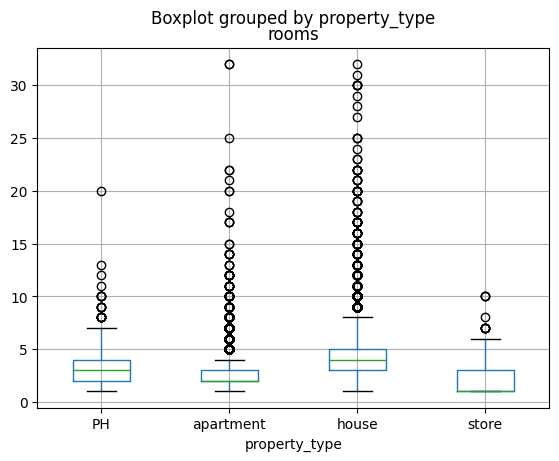

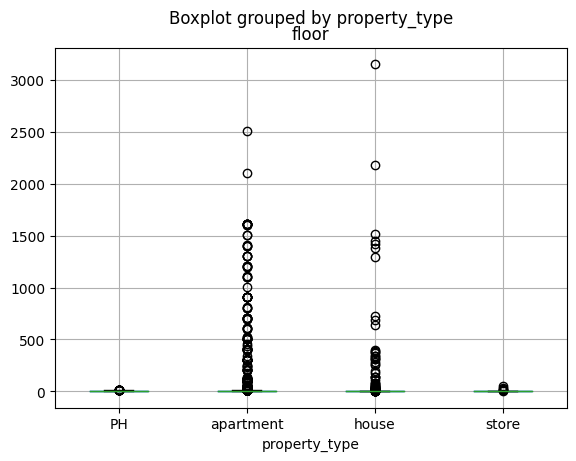

In [100]:
data.boxplot(column= "rooms", by="property_type") 
data.boxplot(column = "floor", by="property_type")
plt.show()

In [102]:
# Veamoslo graficamente para una sola variable
#df['variable'].plot(kind = 'box')
#plt.show()

In [ ]:
#para los metros cubiertos y metros totales
#df[['Metros_Cubiertos','Metros_Totales']].plot(kind = 'box', logy = True)
#plt.show()

In [ ]:
print(data["rooms"].info())
print("__________________________")
print("Cantidad de datos nulos: ", data["rooms"].isnull().sum())


In [ ]:
data[['price_aprox_local_currency',"price", "currency"]].describe(include ="all").round(2)
#no muestra mucho solo queria ver

Exploracion de las columnas relacionadas con la ubicacion Por Provincia, Ciudad/Barrio 
- place_name                        
- place_with_parent_names            
- state_name  
--------------------
- Exploramos las columnas 
- Visualizar los nan de estas columnas
- Corroborar que hay relacion entre el barrio/ciudad o "place_name" y la concatenacion de ubicacion en "place_with_parent_names" para ver si efectivamente corresponden o hay barrios mezclados

- Exploramos las columnas relacionadas a la localizacion politica de los inmuebles

In [103]:
data[["place_with_parent_names", "state_name", "place_name"]].describe()

,place_with_parent_names,state_name,place_name
count,121220,121220,121197
unique,1164,28,1060
top,|Argentina|Santa Fe|Rosario|,Capital Federal,Córdoba
freq,8504,32316,9254


In [ ]:
#ubicacion por provincia
data["state_name"].value_counts() #Excludes NA values by default.

#notamos que los datos estan concentrados en Buenos Aires: capital federal, GBA Norte y sur, Cordoba, Santa fe, buenos aires costa atlantica 

In [ ]:
#ubicacion por ciudad-partido o barrio/localidad
 
data["place_name"].value_counts().head(20)

#este atributo tiene contenido ciudades principales/partidos y barrios
#Capital federal es un registro de state_name por lo cual no broinda mayor informacion  
#Tigre es una ciudad al norte de la ciudad de Buenos Aires.
# Nordelta es una localidad urbana en el Partido de Tigre, Provincia de Buenos Aires 

#Capital Federal    1297

In [104]:
#hacemos un agrupamiento de los place_name que conforman state_name
pd.options.display.max_rows = None
data.groupby(["state_name"])["place_name"].value_counts()

state_name                    place_name                               
Bs.As. G.B.A. Zona Norte      Tigre                                        3324
                              Nordelta                                     3315
                              Pilar                                        2225
                              Olivos                                       1590
                              Martínez                                     1058
                              Escobar                                      1037
                              San Isidro                                    990
                              San Miguel                                    752
                              Vicente López                                 681
                              San Fernando                                  643
                              Florida                                       620
                              Benavidez         

In [105]:
#Para state_name vemos: cuales son los datos de place_name más frecuente, su frecuencia y cuantos refistros diferentes existen 

data.groupby(["state_name"])["place_name"].describe()

#el atributo place_name está representado principalmente por una ciudad-partido de la provincia, también por barrios como en el
#caso de belgrano en capital federal

#count: cuenta el numero de registros no incluye null
#unique:  número de objetos distintos en la columna,
#top: es el dato más frecuente que se produce,
#freq: es la cantidad de veces que aparece el objeto “top” en la columna

,count,unique,top,freq
state_name,,,,
Bs.As. G.B.A. Zona Norte,25537,264,Tigre,3324
Bs.As. G.B.A. Zona Oeste,9322,78,Morón,1209
Bs.As. G.B.A. Zona Sur,13952,123,La Plata,2534
Buenos Aires Costa Atlántica,10006,87,Mar del Plata,6534
Buenos Aires Interior,2291,99,Bahía Blanca,480
Capital Federal,32316,62,Belgrano,2992
Catamarca,27,6,Manantiales,17
Chaco,57,7,Resistencia,37
Chubut,259,16,Cushamen,100


In [ ]:
#Para el atribut place_with_parent_names vemos algunos registros ya que vimos en la descripcion que más de 1100 registros unicos 

data["place_with_parent_names"].value_counts().head(20) 

#el atributo concatena las divisiones de la localizacion: pais/ "country_name", la provincia/ "state_name" (o division de la provincia),
#  la ciudad principal/partido-municipio o barrio en el caso de capital federal"place_name"
#y un adicional que puede ser una localidad del partido (ejem: |Argentina|Bs.As. G.B.A. Zona Norte|Tigre|*Nordelta*|)
#el registro tiene entre 2  y 4 concatenaciones: 2 concantenaciones solo muestra hasta la ubicacion por provincia, no brinda informacion relevante

###|Argentina|Capital Federal|  1297 no tiene nombre de barrio, desestimar o completar? 
#|Argentina|Córdoba|    2648

#esta columna puede usarse para completar los datos faltantes de place_name 
#podemos chequear si el atributo "place_name" coincide con los datos aquí plasmados

- Visualizar los nan de las columnas

In [ ]:
# de la aplicacion del método isna().sum() en data obtuvimos la cantidad de nulos por atributo de localizacion 
# place_name                        23
# place_with_parent_names            0
# country_name                       0
# state_name                         0

#solo la columna place_name tiene valores nulos

In [106]:
#vemos que filas son y como podemos completarlas o no

data[data.place_name.isna()].head(1)

#Podemos ver que todos los registros en  de place_with_parent.. tienen un dato que no fue completado y aparece entre dos ||
#al ser 23 datos se pueden ubicar los barrios usando las coordenadas o pueden completarse con fillna con el dato de "Tigre"
#  ya que vimos en place_name que "Tigre" tiene 3324 registros, un valor signif

#mas adelante identificaremos que filas de place_name son nan

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,...,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,precio_usd_m2_calculado
6489,sell,house,NaN,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre||,Argentina,Bs.As. G.B.A. Zona Norte,NaN,"-34.4008968545,-58.63809847",-34.400897,-58.638098,...,2708.333333,2708.333333,NaN,NaN,NaN,http://www.properati.com.ar/15ui7_venta_casa_t...,"Espectacular casa moderna de una planta, con a...",Venta de casa en Santa María de Tigre,https://thumbs4.properati.com/7/vQjgbHSz1fKXxy...,2708.333333


Visualicemos si existe relacion entre las tres columnas de ubicacion politica del dataframe

In [ ]:
data.loc[:, ["place_with_parent_names", 'state_name', 'place_name']].sample(20)
#aparentemente parecen coincidir

In [ ]:
print(data["place_with_parent_names"][4]) #ejemplo de 4 divisiones
print(data["place_with_parent_names"][121216])
print(data["place_with_parent_names"][43904]) #ejemplo de 3 divisiones
print(data["place_with_parent_names"][78457]) 
print(data["place_with_parent_names"][87750]) #ejemplo de 2 divisiones

#el registro con 2 concantenaciones solo muestra hasta la ubicacion por provincia, no brinda informacion relevante


- Corroborar que hay relacion entre place_name (ciudad/partido/barrio)  y los registros completados en "place_with_parent_names" o no

"place_with_parent_names" es una concatenacion de |país|provincia|ciudad-partido|localidad o barrio| 

"place_name" está representado principalmente por una ciudad-partido de la provincia y en algunos casos la localidad o el barrio

De este modo, para ver la relacion de ambas columnas podemos separar en bloques con "|" y extraer el str asociado a la ciudad-partido y localidad o barrio. 
para que segun la los valores unicos de place_name es el ##tercer## str del bloque

vemos que hay registros que solo se completó hasta la provincia como |Argentina|Córdoba|, hay que investigar un poquito si es porque la ciudad es la misma o en el caso de
|Argentina|Capital Federal, donde vimos que en place_name se completa de nuevo con capital federal

In [ ]:
#con la funcion split separamos el string completo
data['place_with_parent_names'].apply(lambda x: len(x.split("|"))) 

#veo como realiza la separaciones: toma el simbolo | como una separacion al principio y al final 
# 0 |Argentina|Capital Federal|Mataderos| tiene 5 sep  
# 4 |Argentina|Buenos Aires Costa Atlántica|Mar del Plata|Centro| tiene 6 sep

In [ ]:
#probando
holis = data['place_with_parent_names'].apply(lambda x: x.lstrip("|").rstrip("|").split("|"))
holis.apply(lambda x: len(x)).value_counts()

#aqui agrupamos la division de str por | 
# |Arg|buenos aires|tigre|nordelta||
# y el orden de frecuencia de la cantidad str
# 3 str "Arg","buenos aires", "tigre"
# 4 str "Arg","buenos aires", "tigre", "nordelta"
# 2 str "Arg","buenos aires"
# 5 str "Arg","buenos aires", "tigre", "nordelta", "x" o "" ¿?

In [ ]:
# Contamos la cantidad de grupos de str de cada fila de la lista place_with_parent_names
##tengo diferencia con Luis en 5 y 6
data['place_with_parent_names'].apply(lambda x: len(x.split("|"))).value_counts()

#aqui agrupamos el conteo de separaciones de
# |Arg|buenos aires|tigre|nordelta||
# y el orden de frecuencia
# 4 divisiones  |Arg|buenos aires|
#5 divisiones |Arg|buenos aires|tigre|
#6 divisiones |Arg|buenos aires|tigre|nordelta|
#7 divisiones |Arg|buenos aires|tigre|nordelta|x| debe existir otro dato x o doble ||

In [ ]:
#vemos cuantas separaciones unicas existen
data['place_with_parent_names'].apply(lambda x: len(x.split("|"))).unique()

In [107]:
#separo el data para mejor manejo las columnas de interes ##ya lo habia hecho arriba
df_loc_politica_only = data.loc[:, ["place_with_parent_names", "state_name", "place_name"]]
df_loc_politica_only.describe()

,place_with_parent_names,state_name,place_name
count,121220,121220,121197
unique,1164,28,1060
top,|Argentina|Santa Fe|Rosario|,Capital Federal,Córdoba
freq,8504,32316,9254


|Argentina|Buenos Aires Costa Atlántica|Mar del Plata|Centro|
    1               2                           3          4
          | state_place                | place_name  |place_name|(alternativo barrio)

In [108]:
##place_with_parent_names vs state_place
##para ver la coincidencia con la provincia me interesa el 2do str de la cadena place_with_parent y creamos una nueva columna
sep_str_1 = 2 #esta variable es la posicion que ocupa provincia en el str de place_with_parent_names
df_loc_politica_only['state_filt'] = df_loc_politica_only["place_with_parent_names"].apply( lambda x: x.split("|")[sep_str_1])
df_loc_politica_only['state_filt'] #creamos una nueva columna con los datos extraidos de place_with_parent...

0                      Capital Federal
1               Bs.As. G.B.A. Zona Sur
2                      Capital Federal
3                      Capital Federal
4         Buenos Aires Costa Atlántica
5                           Entre Ríos
6             Bs.As. G.B.A. Zona Norte
7                      Capital Federal
8                      Capital Federal
9                             Santa Fe
10                             Córdoba
11            Bs.As. G.B.A. Zona Norte
12            Bs.As. G.B.A. Zona Norte
13                     Capital Federal
14                     Capital Federal
15            Bs.As. G.B.A. Zona Norte
16                     Capital Federal
17            Bs.As. G.B.A. Zona Norte
18            Bs.As. G.B.A. Zona Norte
19                     Capital Federal
20                             Córdoba
21                     Capital Federal
22            Bs.As. G.B.A. Zona Oeste
23            Bs.As. G.B.A. Zona Norte
24            Bs.As. G.B.A. Zona Oeste
25            Bs.As. G.B.

In [109]:
#comparo si el filtro de state "state_filt" es igual a la columna original "state_place"
son_iguales_1 = df_loc_politica_only["state_name"] == df_loc_politica_only["state_filt"]
son_iguales_1.value_counts()

True    121220
dtype: int64

In [110]:
# country_name (de luis)
print("null values:", df_loc_politica_only['state_name'].isna().sum())
mask = ~df_loc_politica_only.apply(lambda x: x['state_name'] in x['place_with_parent_names'], axis=1)
print("place_with_parent_names difference with state_name:", df_loc_politica_only[mask].shape[0])

null values: 0
place_with_parent_names difference with state_name: 0


In [ ]:
#no me quiere resolver
# mask_5 = location_data['place_with_parent_names'].apply(lambda x: len(x) == 5)
# location_data_5_elements = location_data[mask_5].copy()
# location_data_5_elements['place_with_parent_names'][17]

In [114]:
print(df_loc_politica_only.iloc[17,0])
print(df_loc_politica_only.iloc[17,1])
print(df_loc_politica_only.iloc[17,2])

|Argentina|Bs.As. G.B.A. Zona Norte|Tigre|Nordelta|Barrio El Golf|
Bs.As. G.B.A. Zona Norte
Barrio El Golf


In [115]:
#place_with_parent_names vs place_name
##para ver la coincidencia con ciudad/partido me interesa el 3er str que ocupa la cadena place_with_parent..
# Al comparar con place_name pueden pasar dos cosas: 1) que no esté el dato de ciudad/partido y por consiguiente tampoco
# el barrio (en ambos casos aqui dara celdas vacias)
#2) que este completo y además tenga la localidad/barrio, pero el lambda no me da ese str porque hay casos donde no esta
# ese dato y no puede correr el código (por lo que place_name debe coincidir con alguna de ellas dos ¿como lo hago?)

sep_str_2 = 3 #extrae el caso 1)
df_loc_politica_only['place_filt'] = df_loc_politica_only["place_with_parent_names"].apply( lambda x: x.split("|")[sep_str_2])
df_loc_politica_only['place_filt'].value_counts()

Tigre                                  8983
Rosario                                8504
Mar del Plata                          7710
Córdoba                                6606
                                       4780
Palermo                                4083
Vicente López                          3663
Lomas de Zamora                        3470
La Plata                               3360
Pilar                                  3252
San Isidro                             3009
Belgrano                               2992
Morón                                  2645
La Matanza                             2347
Caballito                              2273
Escobar                                1909
Lanús                                  1816
Ituzaingó                              1772
Villa Urquiza                          1632
Almirante Brown                        1603
General San Martín                     1582
Recoleta                               1547
Flores                          

In [116]:
df_loc_politica_only.iloc[17,:] ##doy una vista previa a la data, veo que hay algunas celdas vacias y otras que no coinciden

place_with_parent_names    |Argentina|Bs.As. G.B.A. Zona Norte|Tigre|Nord...
state_name                                          Bs.As. G.B.A. Zona Norte
place_name                                                    Barrio El Golf
state_filt                                          Bs.As. G.B.A. Zona Norte
place_filt                                                             Tigre
Name: 17, dtype: object

In [117]:
#comparo las columnas
places_match = (df_loc_politica_only['place_filt'] == df_loc_politica_only['place_name'])
places_match.value_counts()

#hay 35193 registros donde place_name no coincide con la posicion de place_with_parent_name, esto es porque esta ultima columna
# no está completa y porque no he sacado los datos de la cuarta posicion

True     86027
False    35193
dtype: int64

In [118]:
#lo mismo que arriba pero las que son verdadera para sacar los indices
place_no_match = (df_loc_politica_only['place_filt'] != df_loc_politica_only['place_name'])
df_loc_politica_only_no_match = df_loc_politica_only[place_no_match]
df_loc_politica_only_no_match.index

Int64Index([     4,      6,     12,     13,     14,     15,     17,     24,
                25,     26,
            ...
            121204, 121205, 121206, 121210, 121211, 121212, 121213, 121216,
            121218, 121219],
           dtype='int64', length=35193)

In [ ]:
print(place_no_match.value_counts())

In [119]:
#quiero ver si place_filt tiene valores nulos
mascara_nulos_place_filt= df_loc_politica_only.iloc[:,3].astype(str) == "nan"
print(mascara_nulos_place_filt.value_counts())

False    121220
Name: state_filt, dtype: int64


In [120]:
#en la nueva columna place_filt creo una mascara para ver las celdas con registros vacios: donde place_with_parent.. no tienen localidad/barrio)
#saco el total de casos y el index
mascara_place_filt_vacios = df_loc_politica_only["place_filt"] == ""

print(mascara_place_filt_vacios.value_counts())

#print(df_loc_politica_only[mascara_vacios])
print(df_loc_politica_only[mascara_place_filt_vacios].index)

#4780 datos vacios que le faltan completar el partido/barrio:en la columna original de place_name estos datos están compuestos
# por el registro de state_place, por lo que dejarlos así no brindarian informacion a una relacion por localida-barrio 

False    116440
True       4780
Name: place_filt, dtype: int64
Int64Index([   108,    110,    115,    119,    121,    125,    201,    311,
               315,    316,
            ...
            121198, 121199, 121200, 121201, 121202, 121203, 121204, 121205,
            121206, 121219],
           dtype='int64', length=4780)


In [ ]:
mascara_nulos = df_loc_politica_only["place_name"].astype(str) == "nan"
#mascara_nulos= df_loc_politica_only.iloc[:,2].astype(str) == "nan"

#mascar_nulos

print(mascara_nulos.value_counts())
print(df_loc_politica_only[mascara_nulos].index)

In [ ]:
place_no_match = (data_copy['place_filt_2'] != data_copy['place_name'])
data_copy_no_match = data_copy[place_no_match]
data_copy_no_match.loc[:, ["place_with_parent_names", 'place_name', 'place_filt_2']]

#hay 35193 filas diferentes entre place_name y place_filt_2 pero posiblemnete correctas donde no he podido comparar con el 4 str y 
# contiene los datos vacios

In [ ]:
#no borrar

#sacamos los de 4 separaciones 
data_copy = data
#split_place_filtro = data_copy['place_with_parent_names'].apply(lambda x: len(x.split("|"))!=4)
#data_copy = data_copy.loc[split_place_filtro]

In [ ]:
#extraemos la posicion donde está barrio y lo agregamos en una nueva columna >> place_filt.
#filtramos el ##tercer## str del bloque
sep_str = 3
data_copy['place_filt_2'] = data_copy['place_with_parent_names'].apply( lambda x: x.split("|")[sep_str])

#esta no me sirve para comparar diferencias porque en realidad no puedo extraer la cuarta columna por eso me dan diferentes

In [ ]:
data_copy.loc[:, ["place_with_parent_names", 'place_name', 'place_filt_2']].sample(20)

In [ ]:
print(data["place_with_parent_names"][94288]) #place_name tiene tanto nombre de ciudades como de barrios
print(data["place_with_parent_names"][66350])
print(data["place_with_parent_names"][97449])
print(data["place_with_parent_names"][21596]) 

In [ ]:

place_no_match = (data_copy['place_filt_2'] != data_copy['place_name'])
data_copy_no_match = data_copy[place_no_match]
data_copy_no_match.loc[:, ["place_with_parent_names", 'place_name', 'place_filt_2']]

#hay 35193 filas diferentes entre place_name y place_filt_2 pero posiblemnete correctas donde no he podido comparar con el 4 str y 
# contiene los datos vacios

In [ ]:
data_copy_no_match.index #aqui estan todos los indices de las filas que no coinciden, si quiero volver a matchear place_nam de los barrios
# elimino los indices donde están los vaciis

In [ ]:
pruebo = data_copy_no_match["place_filt"] == "" #si contiene los vacios
pruebo.unique()

In [ ]:
pruebo.value_counts()

In [133]:
#de la data original tomo la columna place_name
extr_place_name = data.iloc[:,2].astype(str) #no me lee los nan sino lo convierto a str

extr_place_name

0                                         Mataderos
1                                          La Plata
2                                         Mataderos
3                                           Liniers
4                                            Centro
5                                      Gualeguaychú
6                                             Munro
7                                          Belgrano
8                                          Belgrano
9                                           Rosario
10                                          Córdoba
11                                       San Miguel
12                                         Martínez
13                                     Palermo Soho
14                                     Palermo Soho
15                                      Bella Vista
16                                        Mataderos
17                                   Barrio El Golf
18                                            Tigre
19          

In [134]:
masc = extr_place_name == "nan" #creo una mascar para saber que filas son nan
#masc

In [135]:
filas_nan = extr_place_name[masc].index #aplico la masc y creo una variable con los indices de las filas nan
filas_nan

Int64Index([ 6489, 10201, 11451, 14839, 18622, 21922, 23664, 24722, 38856,
            45970, 46642, 53130, 55306, 57703, 57759, 57764, 57793, 58004,
            58037, 59069, 62411, 62413, 63849],
           dtype='int64')

In [136]:
data.loc[filas_nan, ["place_with_parent_names", 'state_name', 'place_name']] #visualizo los nan para ver como completarlos


,place_with_parent_names,state_name,place_name
6489,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre||,Bs.As. G.B.A. Zona Norte,NaN
10201,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre||,Bs.As. G.B.A. Zona Norte,NaN
11451,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre||,Bs.As. G.B.A. Zona Norte,NaN
14839,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre||,Bs.As. G.B.A. Zona Norte,NaN
18622,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre||,Bs.As. G.B.A. Zona Norte,NaN
21922,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre||,Bs.As. G.B.A. Zona Norte,NaN
23664,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre||,Bs.As. G.B.A. Zona Norte,NaN
24722,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre||,Bs.As. G.B.A. Zona Norte,NaN
38856,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre||,Bs.As. G.B.A. Zona Norte,NaN
45970,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre||,Bs.As. G.B.A. Zona Norte,NaN


In [ ]:
import re

In [ ]:
texto_tigre = data.loc[filas_nan, ["place_with_parent_names"]].astype(str)
texto_tigre
#re.findall(r'Tigre', texto_tigre)

In [ ]:
import re  

In [ ]:
data.iloc[121219:,]
#podriamos comparar las columnas a ver si pasa esto de que no hay datos geor y 
#esta fila sirve si la posterior correlacion la hago con state_name/provincia

In [ ]:
data[["description", "title"]][121219:]

In [ ]:
data[data.surface_total_in_m2.isna()].head(4)


In [ ]:
print(data["description"][121219])
print("----------")
print(data["title"][121219])

In [ ]:
print(data["description"][3])
print("----------")
print(data["title"][3])

In [ ]:
#probar con esto

In [ ]:

#ejemplo de pagina
#df.apply(lambda x: x['Name'].split('|', 1)[-1] if x['Age'] > 16 and len(x['Name'].split('|',1))>1 else np.nan, axis=1)

VAMOS CON LOS DATOS DE UBICACION GEOGRAFICA
1. # grupos de columas para poder trabajar con ellas de forma mas sencilla
places = ['place_name','place_with_parent_names', 'country_name','state_name']
geolocation = ['geonames_id', 'lat-lon','lat','lon']

# Creamos un nuevo dataframe con las columnas que me interesan
geo_location_data = data[ geolocation].copy()
geo_location_data.head()

In [ ]:
# grupos de columas para poder trabajar con ellas de forma mas sencilla
places = ['place_name','place_with_parent_names', 'country_name','state_name']
geolocation = ['state_name','geonames_id', 'lat-lon','lat','lon']

# Creamos un nuevo dataframe con las columnas que me interesan
geo_location_data = data[ geolocation]
geo_location_data.head()

,state_name,geonames_id,lat-lon,lat,lon
0,Capital Federal,3430787.0,"-34.6618237,-58.5088387",-34.661824,-58.508839
1,Bs.As. G.B.A. Zona Sur,3432039.0,"-34.9038831,-57.9643295",-34.903883,-57.964330
2,Capital Federal,3430787.0,"-34.6522615,-58.5229825",-34.652262,-58.522982
3,Capital Federal,3431333.0,"-34.6477969,-58.5164244",-34.647797,-58.516424
4,Buenos Aires Costa Atlántica,3435548.0,"-38.0026256,-57.5494468",-38.002626,-57.549447


In [132]:
geo_location_data.loc[:, ["geonames_id", "lat", 'lon', 'state_name']].head(15)


,geonames_id,lat,lon,state_name
0,3430787.0,-34.661824,-58.508839,Capital Federal
1,3432039.0,-34.903883,-57.964330,Bs.As. G.B.A. Zona Sur
2,3430787.0,-34.652262,-58.522982,Capital Federal
3,3431333.0,-34.647797,-58.516424,Capital Federal
4,3435548.0,-38.002626,-57.549447,Buenos Aires Costa Atlántica
5,3433657.0,-33.014071,-58.519828,Entre Ríos
6,3430511.0,-34.532957,-58.521782,Bs.As. G.B.A. Zona Norte
7,3436077.0,-34.559873,-58.443362,Capital Federal
8,3436077.0,-34.559873,-58.443362,Capital Federal
9,3838574.0,-32.942031,-60.725919,Santa Fe


In [ ]:
mascara_nulos = df_loc_politica_only["place_name"].astype(str) == "nan"

In [ ]:
#creo un nuevo dataframe con las columnas 

In [ ]:

#filas_geo_nans = geo_columnas[masc_geo].index
#filas_geo_nans
